In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering

In [2]:
import numpy as np
import pandas as pd
import scanpy as sc
import scipy.io
import matplotlib.pyplot as plt
import os
import anndata
import harmonypy as hm
import seaborn as sns
import scrublet as scr
import bbknn as bk
%matplotlib inline

/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
sc.settings.set_figure_params(dpi=250,fontsize=10)

In [4]:
adata = sc.read_h5ad("/rds/general/user/snb20/home/2_Organotypic_EC_Heterogeneity/Sanger_Datasets/Resolve/Test/Test2_nolog/bin50_C2-2.h5ad")

In [5]:
adata

AnnData object with n_obs × n_vars = 22497 × 96
    obs: 'X_Y_bins', 'X_coor', 'Y_coor'
    var: 'Genes'
    uns: 'spatial'
    obsm: 'spatial'

In [6]:
adata.obs['arterial_smc'] = (adata.X[:,adata.var_names=='MYH11'] > 1) & (adata.X[:,adata.var_names=='TTN'] == 0)

In [7]:
adata_aec = adata[adata.obs['arterial_smc'] == True]

In [8]:
adata_aec

View of AnnData object with n_obs × n_vars = 552 × 96
    obs: 'X_Y_bins', 'X_coor', 'Y_coor', 'arterial_smc'
    var: 'Genes'
    uns: 'spatial'
    obsm: 'spatial'

In [9]:
data = adata_aec.obs[['X_coor','Y_coor']]
linkage_data = linkage(data, method='average', metric='euclidean')

In [10]:
temp = dendrogram(linkage_data,no_plot=True)

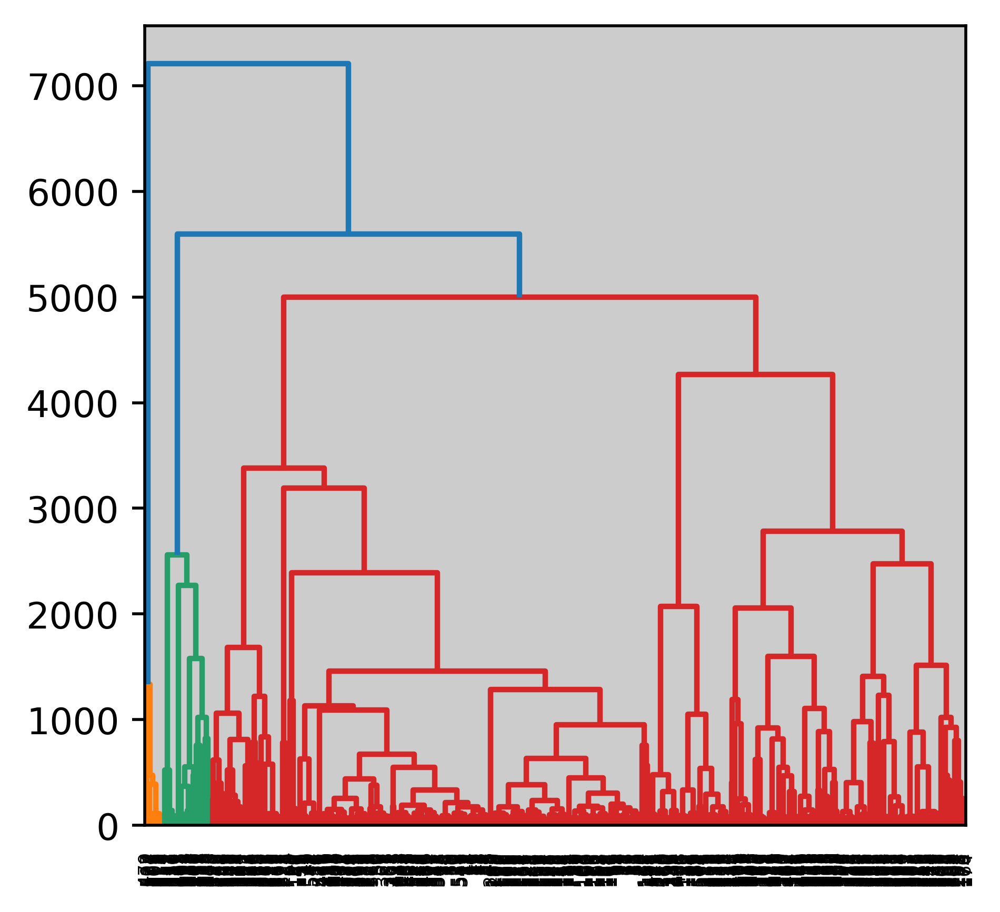

In [11]:
dendrogram(linkage_data)
plt.show()

In [12]:
adata_aec

View of AnnData object with n_obs × n_vars = 552 × 96
    obs: 'X_Y_bins', 'X_coor', 'Y_coor', 'arterial_smc'
    var: 'Genes'
    uns: 'spatial'
    obsm: 'spatial'

In [13]:
# adjust n_clusters to relevant number of vessels
hierarchical_cluster = AgglomerativeClustering(n_clusters=99, affinity='euclidean', linkage='single')

In [14]:
labels = hierarchical_cluster.fit_predict(data) 
print(labels)

[22 22 22 22  3 77 22 22 22  4 22 22 22 22 22 22 22 50 50 50 22 22 22 22
 22 22 22 22 50 50 50 50 22 22 22 22 22 22 22 22 50 50 50 22 22 22 22 22
 22 95 22 22 22 67 67 67 67 65 22 22 22  3  4  4 67 67 67 67 67 67 67 67
 67 67 67 67 67 67 67 23 67 67 67 67 45 23 23 75 67 67 67 67 45 45 63 23
 23 23 67 67 67 67 67 71 67 67 67 67 67 67 67 67 67 55 67 67 67 67  2 22
  4 67 67 67 67 67 86 86 86 67 67 67 67 86 86 67 67 67 67 86 67 67 67 67
 67 67 33 33 72 67 67 67 33 33 67 67 67 67 33 33 10 67 67 67 67 67 67  0
 43 67 67 67 67 67 10 10 10 43 67 67 67 67 67 22 22  4  4 67 67 67 67 67
 67 70  0 67 67 67 67  0 67 66 64 64  1  1  1 57  1  1 29 29 29 29 29 29
 29 29 29 22 22 92  4 85 29 29 29 29 29 29 29 29 28 29 29 28 79 26 26 26
 26 26 26 42 26 26 26 26 69 69 22 22 22 42 26 26 26 69 42 26 26 61 16 16
 16 91 14 14 14 16 14 14 14 14 16 14 20 14 14 14 16 16 16 20 20 16 20 16
 16 22 22 22  4 16 80 48 48 81 58 48 48 48 48 48 48 15 15 24 24 40 48 48
 15 15 15 24 24 24 40 40  6  6 24 24 40 40 40  6 40

/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


In [15]:
adata_aec.obs['SMC_clusters'] = labels
adata_aec.obs['SMC_clusters'] = adata_aec.obs['SMC_clusters'].astype('category')

/var/tmp/pbs.7737892.pbs/ipykernel_2736260/1883412233.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_aec.obs['SMC_clusters'] = labels
/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/contextlib.py:142: FutureWarning: X.dtype being converted to np.float32 from int64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)


In [16]:
adata_aec.obs['SMC_clusters'].value_counts()

22    110
67     98
4      21
29     19
26     15
     ... 
63      1
65      1
66      1
68      1
98      1
Name: SMC_clusters, Length: 99, dtype: int64

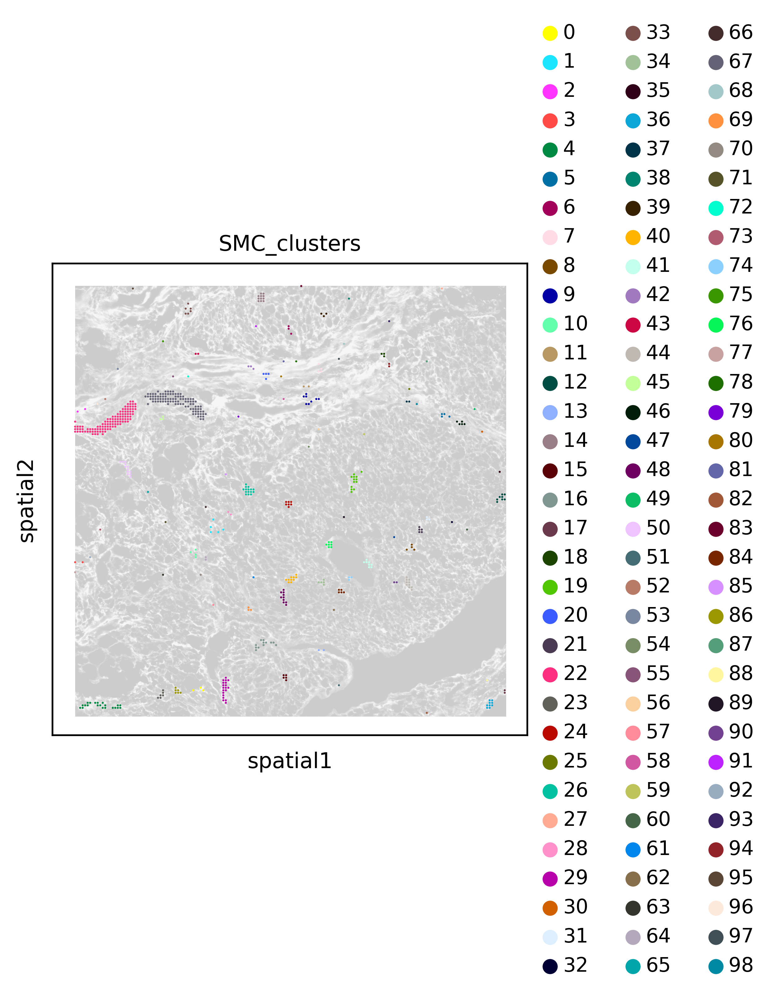

In [17]:
#99
sc.pl.spatial(adata_aec,
              color="SMC_clusters",img_key='WGA',size=8, alpha_img = 0.2)

/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1227: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1227: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


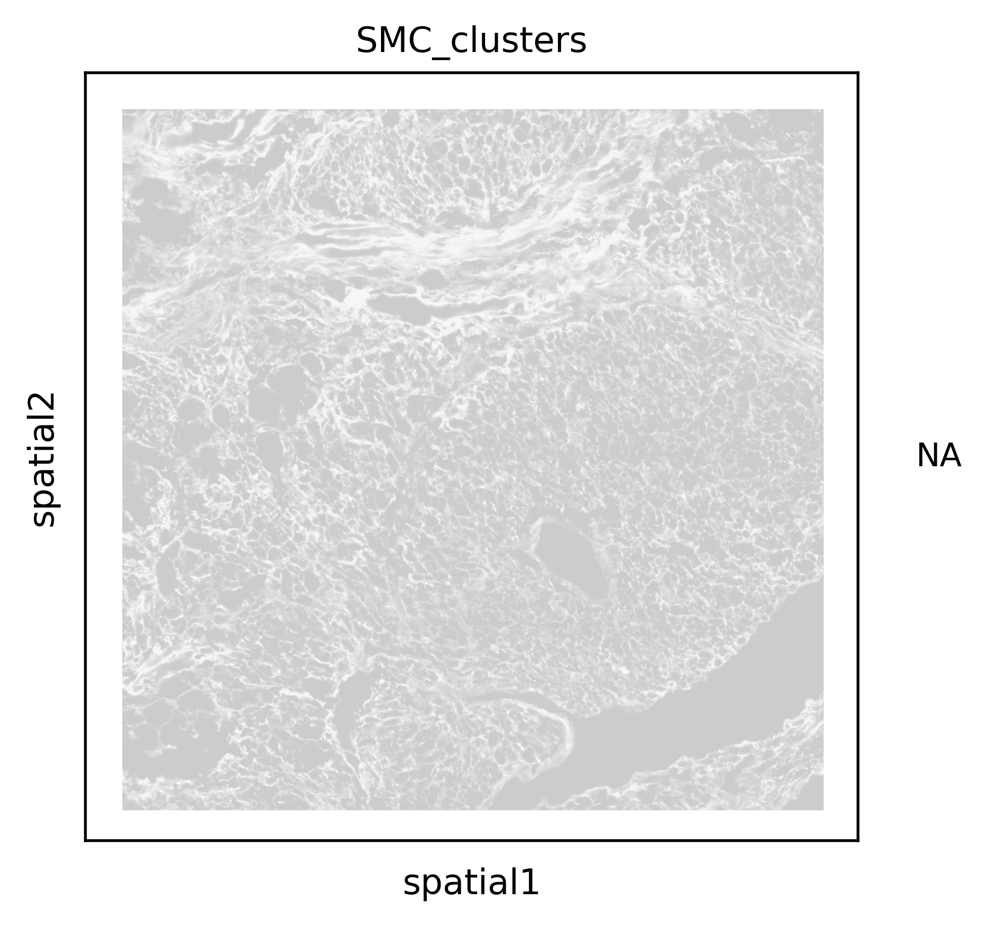

In [18]:
#99
sc.pl.spatial(adata_aec,
              color="SMC_clusters",img_key='WGA',size=8, alpha_img = 0.2, groups = ['76'])

In [19]:
# subset for clusters > 5 bins
adata_aec.obs['SMC_clusters'].value_counts()[adata_aec.obs['SMC_clusters'].value_counts() > 5].index.tolist()

[22,
 67,
 4,
 29,
 26,
 19,
 50,
 16,
 14,
 44,
 48,
 40,
 36,
 9,
 41,
 12,
 24,
 76,
 33,
 23,
 86]

In [20]:
adata_aec_subset = adata_aec[adata_aec.obs.SMC_clusters.isin(adata_aec.obs['SMC_clusters'].value_counts()[adata_aec.obs['SMC_clusters'].value_counts() > 5].index.tolist())]

In [21]:
adata_aec_subset.obs.SMC_clusters = adata_aec_subset.obs.SMC_clusters.astype(str).astype('category')

/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/pandas/core/generic.py:5931: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  self[name] = value


In [22]:
adata_aec_subset

AnnData object with n_obs × n_vars = 406 × 96
    obs: 'X_Y_bins', 'X_coor', 'Y_coor', 'arterial_smc', 'SMC_clusters'
    var: 'Genes'
    uns: 'spatial', 'SMC_clusters_colors'
    obsm: 'spatial'

In [23]:
del adata_aec_subset.uns['SMC_clusters_colors']

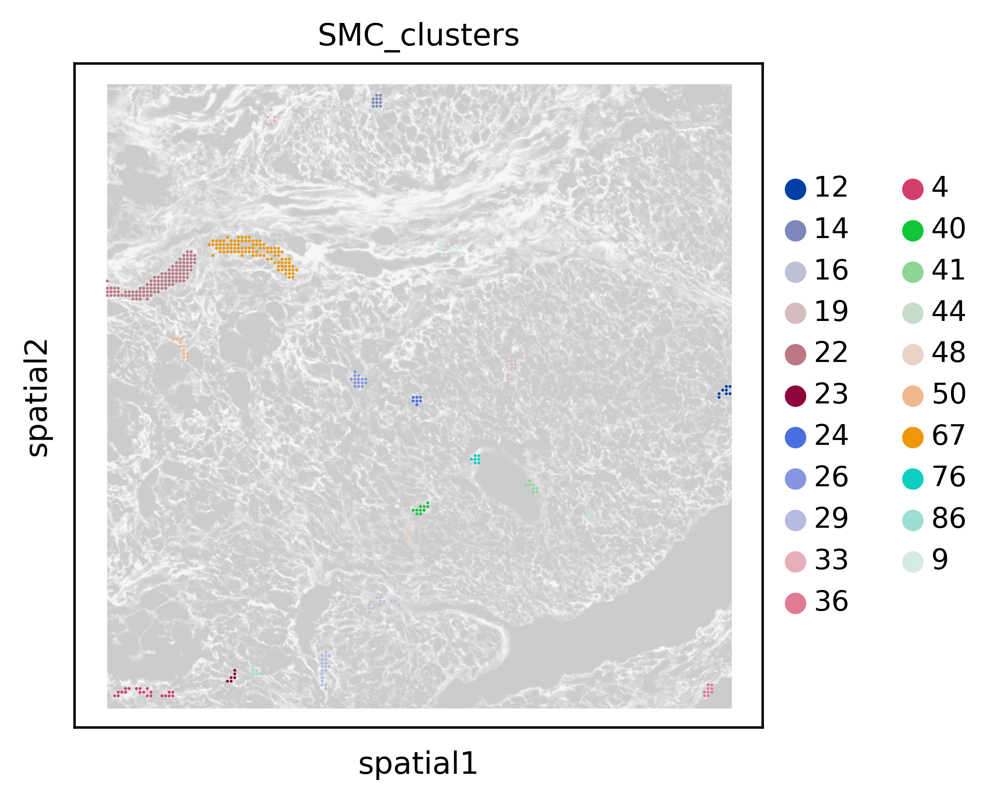

In [24]:
#99
sc.pl.spatial(adata_aec_subset,
              color="SMC_clusters",img_key='WGA',size=8, alpha_img = 0.2)

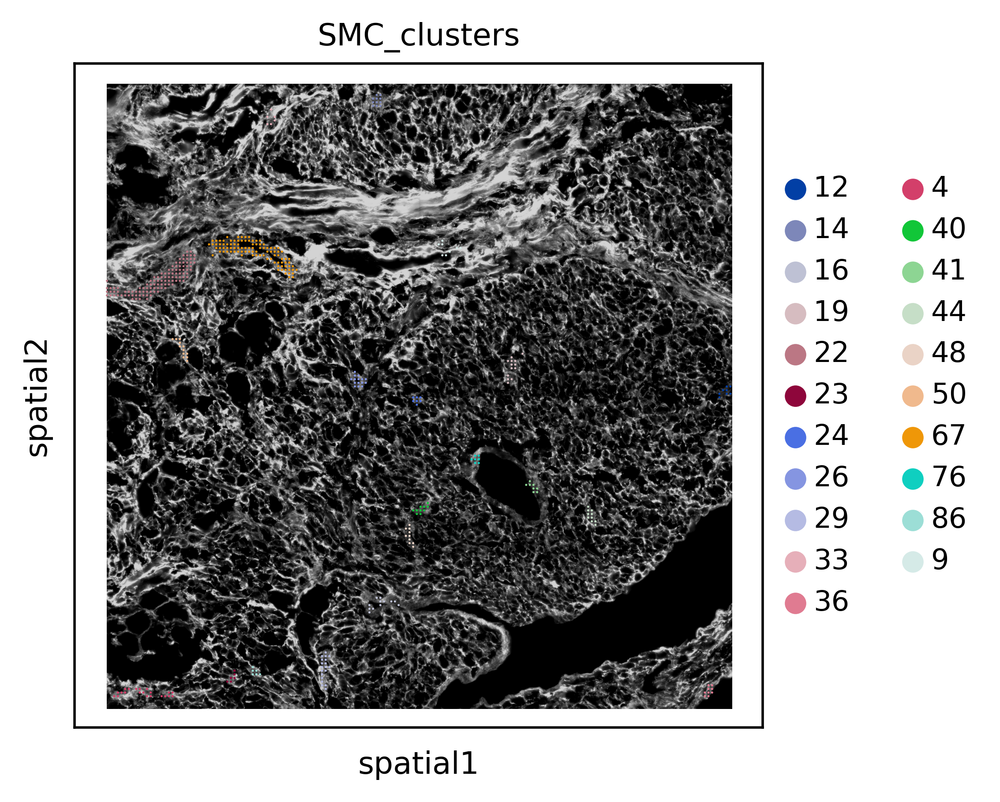

In [25]:
sc.pl.spatial(adata_aec_subset,
              color="SMC_clusters",img_key='WGA',size=6)

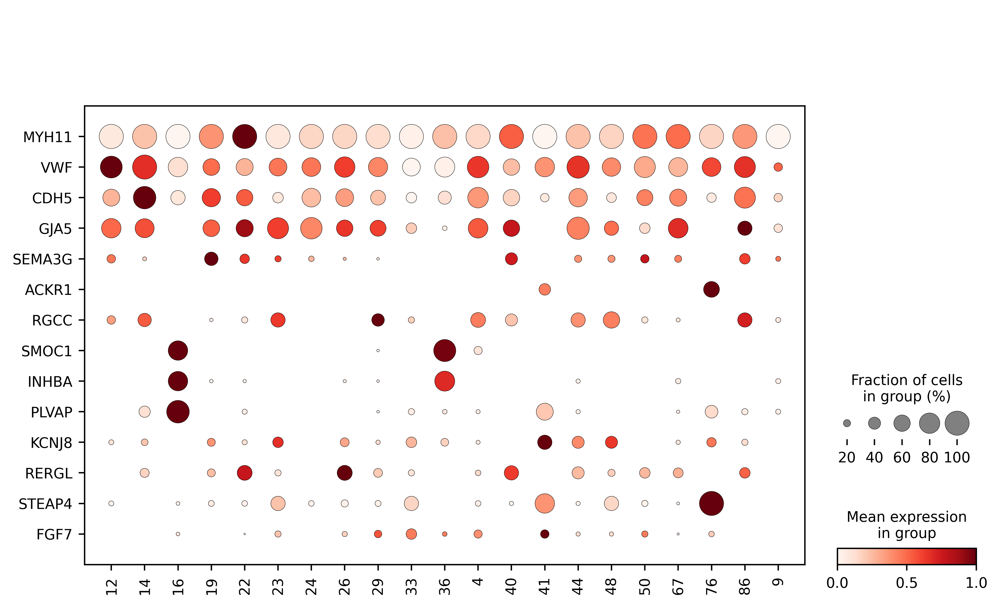

In [26]:
markers = ["MYH11","VWF","CDH5","GJA5","SEMA3G","ACKR1","RGCC","SMOC1","INHBA","PLVAP","KCNJ8","RERGL","STEAP4","FGF7"]
sc.pl.dotplot(adata_aec_subset, markers, "SMC_clusters", cmap = 'Reds', swap_axes = True, standard_scale = 'var')

In [27]:
# add gene percentage expressed to dataframe

In [28]:
adata_aec_subset.obs['RERGL_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='RERGL'] > 0)

In [29]:
adata_aec_subset.obs['STEAP4_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='STEAP4'] > 0)

In [30]:
adata_aec_subset.obs['FGF7_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='FGF7'] > 0)

In [31]:
adata_aec_subset.obs['KCNJ8_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='KCNJ8'] > 0)

In [32]:
adata_aec_subset.obs['AGT_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='AGT'] > 0)

In [33]:
adata_aec_subset.obs['STEAP4_FGF7_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='STEAP4'] > 1) & (adata_aec_subset.X[:,adata_aec_subset.var_names=='FGF7'] > 0)

In [34]:
adata_aec_subset.obs['STEAP4_KCNJ8_percent'] = (adata_aec_subset.X[:,adata_aec_subset.var_names=='STEAP4'] > 1) & (adata_aec_subset.X[:,adata_aec_subset.var_names=='KCNJ8'] > 0)

In [35]:
adata_aec_subset

AnnData object with n_obs × n_vars = 406 × 96
    obs: 'X_Y_bins', 'X_coor', 'Y_coor', 'arterial_smc', 'SMC_clusters', 'RERGL_percent', 'STEAP4_percent', 'FGF7_percent', 'KCNJ8_percent', 'AGT_percent', 'STEAP4_FGF7_percent', 'STEAP4_KCNJ8_percent'
    var: 'Genes'
    uns: 'spatial', 'SMC_clusters_colors'
    obsm: 'spatial'

In [36]:
results = adata_aec_subset.obs[['RERGL_percent','STEAP4_percent','FGF7_percent','KCNJ8_percent','AGT_percent','STEAP4_FGF7_percent','STEAP4_KCNJ8_percent','SMC_clusters']].groupby('SMC_clusters').mean()

In [37]:
results

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent
SMC_clusters,,,,,,,
12,0.000000,0.125000,0.000000,0.125000,0.125000,0.000000,0.000000
14,0.272727,0.000000,0.000000,0.181818,0.909091,0.000000,0.000000
16,0.000000,0.083333,0.083333,0.000000,0.083333,0.000000,0.000000
19,0.230769,0.153846,0.000000,0.230769,0.615385,0.000000,0.076923
22,0.527273,0.145455,0.027273,0.127273,0.636364,0.009091,0.000000
23,0.166667,0.500000,0.166667,0.333333,0.666667,0.166667,0.166667
24,0.000000,0.142857,0.000000,0.000000,0.285714,0.000000,0.000000
26,0.533333,0.200000,0.133333,0.266667,0.466667,0.000000,0.000000
29,0.263158,0.157895,0.210526,0.105263,0.578947,0.052632,0.000000


In [38]:
matrix=pd.DataFrame(adata_aec_subset.X,columns=adata_aec_subset.raw.var.index,index=adata_aec_subset.obs.index)

In [39]:
matrix["SMC_clusters"] = adata_aec_subset.obs["SMC_clusters"]

In [40]:
matrix2 = matrix.replace(0, np.NaN)

In [41]:
df_mean_nonzero =matrix2.groupby("SMC_clusters").mean()

In [42]:
df_mean_nonzero[["RERGL","STEAP4","FGF7","AGT","KCNJ8","SEMA3G","ACKR1","RGCC","SMOC1"]]

Genes,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1
SMC_clusters,,,,,,,,,
12,NaN,1.000000,NaN,2.000000,1.000000,1.000000,NaN,2.500000,NaN
14,1.000000,NaN,NaN,2.700000,1.500000,1.000000,NaN,2.200000,NaN
16,NaN,2.000000,1.000000,2.000000,NaN,NaN,NaN,NaN,3.666667
19,1.666667,3.000000,NaN,1.875000,2.000000,1.166667,NaN,1.000000,NaN
22,2.344828,1.500000,1.333333,4.071429,1.142857,1.187500,NaN,1.000000,NaN
23,1.000000,3.666667,1.000000,6.500000,2.500000,2.000000,NaN,2.333333,NaN
24,NaN,1.000000,NaN,2.500000,NaN,1.000000,NaN,NaN,NaN
26,3.000000,1.000000,1.000000,2.000000,1.500000,2.000000,NaN,NaN,NaN
29,1.200000,1.666667,2.000000,2.090909,1.500000,1.000000,NaN,4.375000,1.000000


### add expression values to dataframe

In [43]:
#mean expression (expressing bins only / cluster)
test = pd.concat([results, df_mean_nonzero[["RERGL","STEAP4","FGF7","AGT","KCNJ8","SEMA3G","ACKR1","RGCC","SMOC1"]]], axis = 1)

In [44]:
test

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1
SMC_clusters,,,,,,,,,,,,,,,,
12,0.000000,0.125000,0.000000,0.125000,0.125000,0.000000,0.000000,NaN,1.000000,NaN,2.000000,1.000000,1.000000,NaN,2.500000,NaN
14,0.272727,0.000000,0.000000,0.181818,0.909091,0.000000,0.000000,1.000000,NaN,NaN,2.700000,1.500000,1.000000,NaN,2.200000,NaN
16,0.000000,0.083333,0.083333,0.000000,0.083333,0.000000,0.000000,NaN,2.000000,1.000000,2.000000,NaN,NaN,NaN,NaN,3.666667
19,0.230769,0.153846,0.000000,0.230769,0.615385,0.000000,0.076923,1.666667,3.000000,NaN,1.875000,2.000000,1.166667,NaN,1.000000,NaN
22,0.527273,0.145455,0.027273,0.127273,0.636364,0.009091,0.000000,2.344828,1.500000,1.333333,4.071429,1.142857,1.187500,NaN,1.000000,NaN
23,0.166667,0.500000,0.166667,0.333333,0.666667,0.166667,0.166667,1.000000,3.666667,1.000000,6.500000,2.500000,2.000000,NaN,2.333333,NaN
24,0.000000,0.142857,0.000000,0.000000,0.285714,0.000000,0.000000,NaN,1.000000,NaN,2.500000,NaN,1.000000,NaN,NaN,NaN
26,0.533333,0.200000,0.133333,0.266667,0.466667,0.000000,0.000000,3.000000,1.000000,1.000000,2.000000,1.500000,2.000000,NaN,NaN,NaN
29,0.263158,0.157895,0.210526,0.105263,0.578947,0.052632,0.000000,1.200000,1.666667,2.000000,2.090909,1.500000,1.000000,NaN,4.375000,1.000000


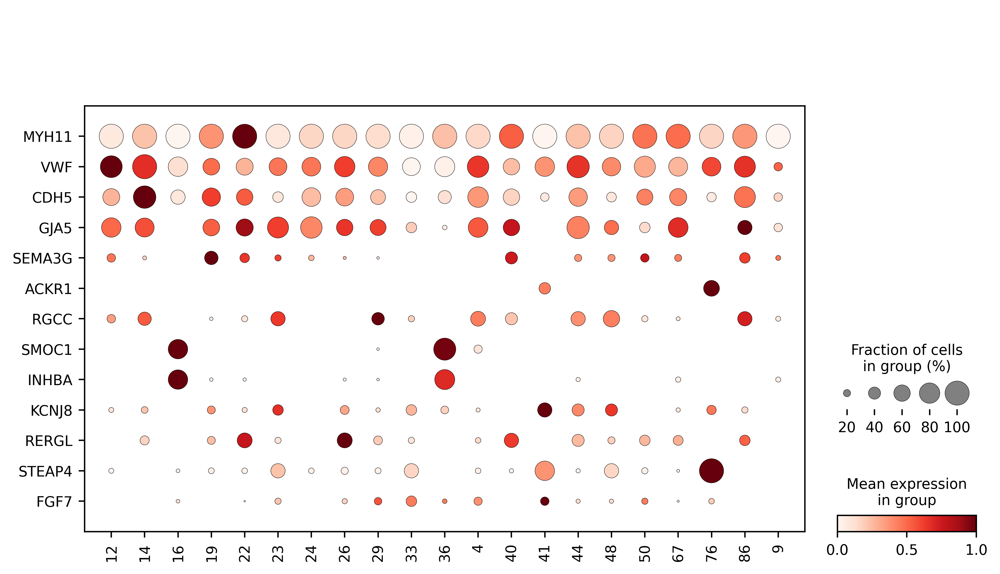

In [45]:
markers = ["MYH11","VWF","CDH5","GJA5","SEMA3G","ACKR1","RGCC","SMOC1","INHBA","KCNJ8","RERGL","STEAP4","FGF7"]
sc.pl.dotplot(adata_aec_subset, markers, "SMC_clusters", cmap = 'Reds', swap_axes = True, standard_scale = 'var')

In [46]:
#add vessel type annotation column

In [47]:
test["Vessel"] = ['Unclear','Artery','Endocardium','Artery','Artery','Capillary','Artery','Artery','Artery','Unclear','Endocardium','Artery','Artery','Vein','Artery','Artery','Artery','Artery','Vein','Artery','Unclear']

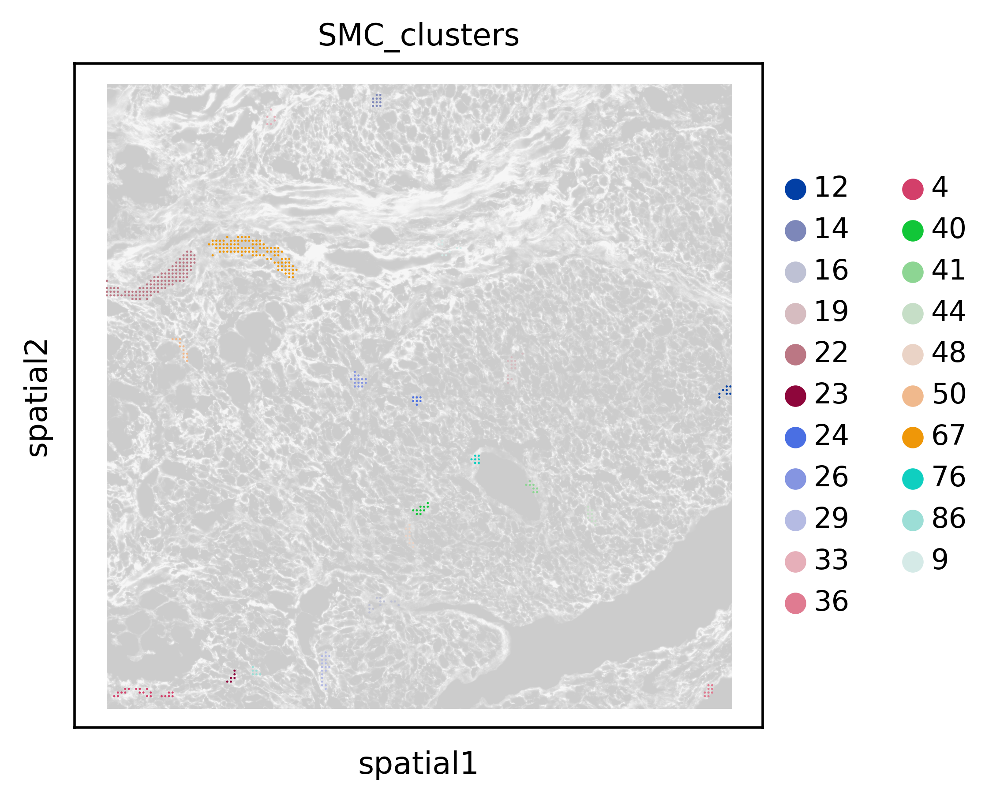

In [48]:
sc.pl.spatial(adata_aec_subset,
              color="SMC_clusters",img_key='WGA',size=6, alpha_img = 0.2)

/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1227: FutureWarning: In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
  values = values.replace(values.categories.difference(groups), np.nan)
/rds/general/user/snb20/home/anaconda3/envs/scanpy1.8.2/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1227: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


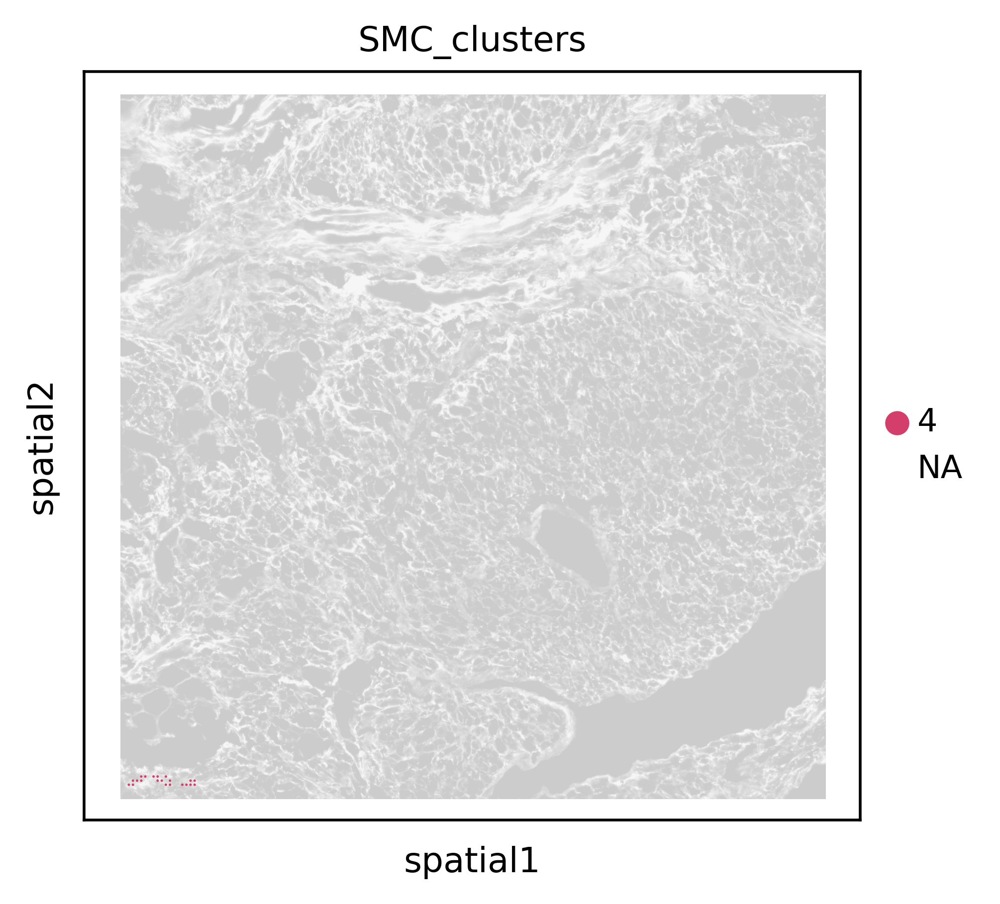

In [49]:
sc.pl.spatial(adata_aec_subset,
              color="SMC_clusters",img_key='WGA',size=6, alpha_img = 0.2, groups = ['4'])

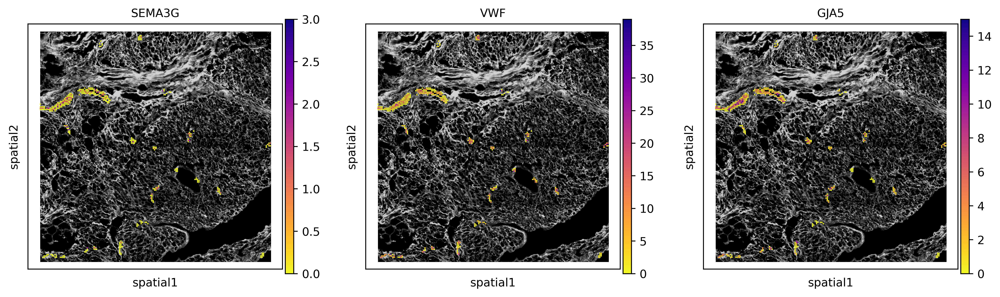

In [50]:
sc.pl.spatial(adata_aec_subset,
              color=["SEMA3G","VWF","GJA5"],img_key='WGA',size=10, cmap = 'plasma_r')

In [51]:
test

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1,Vessel
SMC_clusters,,,,,,,,,,,,,,,,,
12,0.000000,0.125000,0.000000,0.125000,0.125000,0.000000,0.000000,NaN,1.000000,NaN,2.000000,1.000000,1.000000,NaN,2.500000,NaN,Unclear
14,0.272727,0.000000,0.000000,0.181818,0.909091,0.000000,0.000000,1.000000,NaN,NaN,2.700000,1.500000,1.000000,NaN,2.200000,NaN,Artery
16,0.000000,0.083333,0.083333,0.000000,0.083333,0.000000,0.000000,NaN,2.000000,1.000000,2.000000,NaN,NaN,NaN,NaN,3.666667,Endocardium
19,0.230769,0.153846,0.000000,0.230769,0.615385,0.000000,0.076923,1.666667,3.000000,NaN,1.875000,2.000000,1.166667,NaN,1.000000,NaN,Artery
22,0.527273,0.145455,0.027273,0.127273,0.636364,0.009091,0.000000,2.344828,1.500000,1.333333,4.071429,1.142857,1.187500,NaN,1.000000,NaN,Artery
23,0.166667,0.500000,0.166667,0.333333,0.666667,0.166667,0.166667,1.000000,3.666667,1.000000,6.500000,2.500000,2.000000,NaN,2.333333,NaN,Capillary
24,0.000000,0.142857,0.000000,0.000000,0.285714,0.000000,0.000000,NaN,1.000000,NaN,2.500000,NaN,1.000000,NaN,NaN,NaN,Artery
26,0.533333,0.200000,0.133333,0.266667,0.466667,0.000000,0.000000,3.000000,1.000000,1.000000,2.000000,1.500000,2.000000,NaN,NaN,NaN,Artery
29,0.263158,0.157895,0.210526,0.105263,0.578947,0.052632,0.000000,1.200000,1.666667,2.000000,2.090909,1.500000,1.000000,NaN,4.375000,1.000000,Artery


### add vessel size numbers

In [52]:
adata_aec_subset.obs.SMC_clusters.value_counts()

22    110
67     98
4      21
29     19
26     15
19     13
16     12
50     12
14     11
44     10
48     10
40     10
36      9
12      8
41      8
9       8
24      7
76      7
33      6
23      6
86      6
Name: SMC_clusters, dtype: int64

In [53]:
test2 = test.join(adata_aec_subset.obs['SMC_clusters'].value_counts(), on=None, how='left', lsuffix='', rsuffix='', sort=False, validate=None)

In [54]:
test2.columns = list(test2.columns[0:17]) + ['size']

In [55]:
test2

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1,Vessel,size
SMC_clusters,,,,,,,,,,,,,,,,,,
12,0.000000,0.125000,0.000000,0.125000,0.125000,0.000000,0.000000,NaN,1.000000,NaN,2.000000,1.000000,1.000000,NaN,2.500000,NaN,Unclear,8
14,0.272727,0.000000,0.000000,0.181818,0.909091,0.000000,0.000000,1.000000,NaN,NaN,2.700000,1.500000,1.000000,NaN,2.200000,NaN,Artery,11
16,0.000000,0.083333,0.083333,0.000000,0.083333,0.000000,0.000000,NaN,2.000000,1.000000,2.000000,NaN,NaN,NaN,NaN,3.666667,Endocardium,12
19,0.230769,0.153846,0.000000,0.230769,0.615385,0.000000,0.076923,1.666667,3.000000,NaN,1.875000,2.000000,1.166667,NaN,1.000000,NaN,Artery,13
22,0.527273,0.145455,0.027273,0.127273,0.636364,0.009091,0.000000,2.344828,1.500000,1.333333,4.071429,1.142857,1.187500,NaN,1.000000,NaN,Artery,110
23,0.166667,0.500000,0.166667,0.333333,0.666667,0.166667,0.166667,1.000000,3.666667,1.000000,6.500000,2.500000,2.000000,NaN,2.333333,NaN,Capillary,6
24,0.000000,0.142857,0.000000,0.000000,0.285714,0.000000,0.000000,NaN,1.000000,NaN,2.500000,NaN,1.000000,NaN,NaN,NaN,Artery,7
26,0.533333,0.200000,0.133333,0.266667,0.466667,0.000000,0.000000,3.000000,1.000000,1.000000,2.000000,1.500000,2.000000,NaN,NaN,NaN,Artery,15
29,0.263158,0.157895,0.210526,0.105263,0.578947,0.052632,0.000000,1.200000,1.666667,2.000000,2.090909,1.500000,1.000000,NaN,4.375000,1.000000,Artery,19


In [56]:
group=pd.Series("Large", index=test2.index)

In [57]:
group[test2["size"] <= 30] = "Small"

In [58]:
group

SMC_clusters
12    Small
14    Small
16    Small
19    Small
22    Large
23    Small
24    Small
26    Small
29    Small
33    Small
36    Small
4     Small
40    Small
41    Small
44    Small
48    Small
50    Small
67    Large
76    Small
86    Small
9     Small
dtype: object

In [59]:
test2["group"] = group

In [60]:
test2

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1,Vessel,size,group
SMC_clusters,,,,,,,,,,,,,,,,,,,
12,0.000000,0.125000,0.000000,0.125000,0.125000,0.000000,0.000000,NaN,1.000000,NaN,2.000000,1.000000,1.000000,NaN,2.500000,NaN,Unclear,8,Small
14,0.272727,0.000000,0.000000,0.181818,0.909091,0.000000,0.000000,1.000000,NaN,NaN,2.700000,1.500000,1.000000,NaN,2.200000,NaN,Artery,11,Small
16,0.000000,0.083333,0.083333,0.000000,0.083333,0.000000,0.000000,NaN,2.000000,1.000000,2.000000,NaN,NaN,NaN,NaN,3.666667,Endocardium,12,Small
19,0.230769,0.153846,0.000000,0.230769,0.615385,0.000000,0.076923,1.666667,3.000000,NaN,1.875000,2.000000,1.166667,NaN,1.000000,NaN,Artery,13,Small
22,0.527273,0.145455,0.027273,0.127273,0.636364,0.009091,0.000000,2.344828,1.500000,1.333333,4.071429,1.142857,1.187500,NaN,1.000000,NaN,Artery,110,Large
23,0.166667,0.500000,0.166667,0.333333,0.666667,0.166667,0.166667,1.000000,3.666667,1.000000,6.500000,2.500000,2.000000,NaN,2.333333,NaN,Capillary,6,Small
24,0.000000,0.142857,0.000000,0.000000,0.285714,0.000000,0.000000,NaN,1.000000,NaN,2.500000,NaN,1.000000,NaN,NaN,NaN,Artery,7,Small
26,0.533333,0.200000,0.133333,0.266667,0.466667,0.000000,0.000000,3.000000,1.000000,1.000000,2.000000,1.500000,2.000000,NaN,NaN,NaN,Artery,15,Small
29,0.263158,0.157895,0.210526,0.105263,0.578947,0.052632,0.000000,1.200000,1.666667,2.000000,2.090909,1.500000,1.000000,NaN,4.375000,1.000000,Artery,19,Small


In [61]:
test2["vessel_size"] = test2["Vessel"] + "_" + test2["group"]

In [62]:
test2

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1,Vessel,size,group,vessel_size
SMC_clusters,,,,,,,,,,,,,,,,,,,,
12,0.000000,0.125000,0.000000,0.125000,0.125000,0.000000,0.000000,NaN,1.000000,NaN,2.000000,1.000000,1.000000,NaN,2.500000,NaN,Unclear,8,Small,Unclear_Small
14,0.272727,0.000000,0.000000,0.181818,0.909091,0.000000,0.000000,1.000000,NaN,NaN,2.700000,1.500000,1.000000,NaN,2.200000,NaN,Artery,11,Small,Artery_Small
16,0.000000,0.083333,0.083333,0.000000,0.083333,0.000000,0.000000,NaN,2.000000,1.000000,2.000000,NaN,NaN,NaN,NaN,3.666667,Endocardium,12,Small,Endocardium_Small
19,0.230769,0.153846,0.000000,0.230769,0.615385,0.000000,0.076923,1.666667,3.000000,NaN,1.875000,2.000000,1.166667,NaN,1.000000,NaN,Artery,13,Small,Artery_Small
22,0.527273,0.145455,0.027273,0.127273,0.636364,0.009091,0.000000,2.344828,1.500000,1.333333,4.071429,1.142857,1.187500,NaN,1.000000,NaN,Artery,110,Large,Artery_Large
23,0.166667,0.500000,0.166667,0.333333,0.666667,0.166667,0.166667,1.000000,3.666667,1.000000,6.500000,2.500000,2.000000,NaN,2.333333,NaN,Capillary,6,Small,Capillary_Small
24,0.000000,0.142857,0.000000,0.000000,0.285714,0.000000,0.000000,NaN,1.000000,NaN,2.500000,NaN,1.000000,NaN,NaN,NaN,Artery,7,Small,Artery_Small
26,0.533333,0.200000,0.133333,0.266667,0.466667,0.000000,0.000000,3.000000,1.000000,1.000000,2.000000,1.500000,2.000000,NaN,NaN,NaN,Artery,15,Small,Artery_Small
29,0.263158,0.157895,0.210526,0.105263,0.578947,0.052632,0.000000,1.200000,1.666667,2.000000,2.090909,1.500000,1.000000,NaN,4.375000,1.000000,Artery,19,Small,Artery_Small


In [63]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

### add ROI numbers

In [64]:
test2.index = ['ROI_C2-2_' + str(i) for i in test2.index.tolist()]

In [65]:
test2["ROI"] = "C2-2"

In [66]:
test2

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1,Vessel,size,group,vessel_size,ROI
ROI_C2-2_12,0.000000,0.125000,0.000000,0.125000,0.125000,0.000000,0.000000,NaN,1.000000,NaN,2.000000,1.000000,1.000000,NaN,2.500000,NaN,Unclear,8,Small,Unclear_Small,C2-2
ROI_C2-2_14,0.272727,0.000000,0.000000,0.181818,0.909091,0.000000,0.000000,1.000000,NaN,NaN,2.700000,1.500000,1.000000,NaN,2.200000,NaN,Artery,11,Small,Artery_Small,C2-2
ROI_C2-2_16,0.000000,0.083333,0.083333,0.000000,0.083333,0.000000,0.000000,NaN,2.000000,1.000000,2.000000,NaN,NaN,NaN,NaN,3.666667,Endocardium,12,Small,Endocardium_Small,C2-2
ROI_C2-2_19,0.230769,0.153846,0.000000,0.230769,0.615385,0.000000,0.076923,1.666667,3.000000,NaN,1.875000,2.000000,1.166667,NaN,1.000000,NaN,Artery,13,Small,Artery_Small,C2-2
ROI_C2-2_22,0.527273,0.145455,0.027273,0.127273,0.636364,0.009091,0.000000,2.344828,1.500000,1.333333,4.071429,1.142857,1.187500,NaN,1.000000,NaN,Artery,110,Large,Artery_Large,C2-2
ROI_C2-2_23,0.166667,0.500000,0.166667,0.333333,0.666667,0.166667,0.166667,1.000000,3.666667,1.000000,6.500000,2.500000,2.000000,NaN,2.333333,NaN,Capillary,6,Small,Capillary_Small,C2-2
ROI_C2-2_24,0.000000,0.142857,0.000000,0.000000,0.285714,0.000000,0.000000,NaN,1.000000,NaN,2.500000,NaN,1.000000,NaN,NaN,NaN,Artery,7,Small,Artery_Small,C2-2
ROI_C2-2_26,0.533333,0.200000,0.133333,0.266667,0.466667,0.000000,0.000000,3.000000,1.000000,1.000000,2.000000,1.500000,2.000000,NaN,NaN,NaN,Artery,15,Small,Artery_Small,C2-2
ROI_C2-2_29,0.263158,0.157895,0.210526,0.105263,0.578947,0.052632,0.000000,1.200000,1.666667,2.000000,2.090909,1.500000,1.000000,NaN,4.375000,1.000000,Artery,19,Small,Artery_Small,C2-2
ROI_C2-2_33,0.166667,0.500000,0.333333,0.333333,0.500000,0.166667,0.166667,1.000000,2.666667,1.000000,3.333333,1.000000,NaN,NaN,2.000000,NaN,Unclear,6,Small,Unclear_Small,C2-2


[Text(0.5, 1.0, 'RERGL percentage expression')]

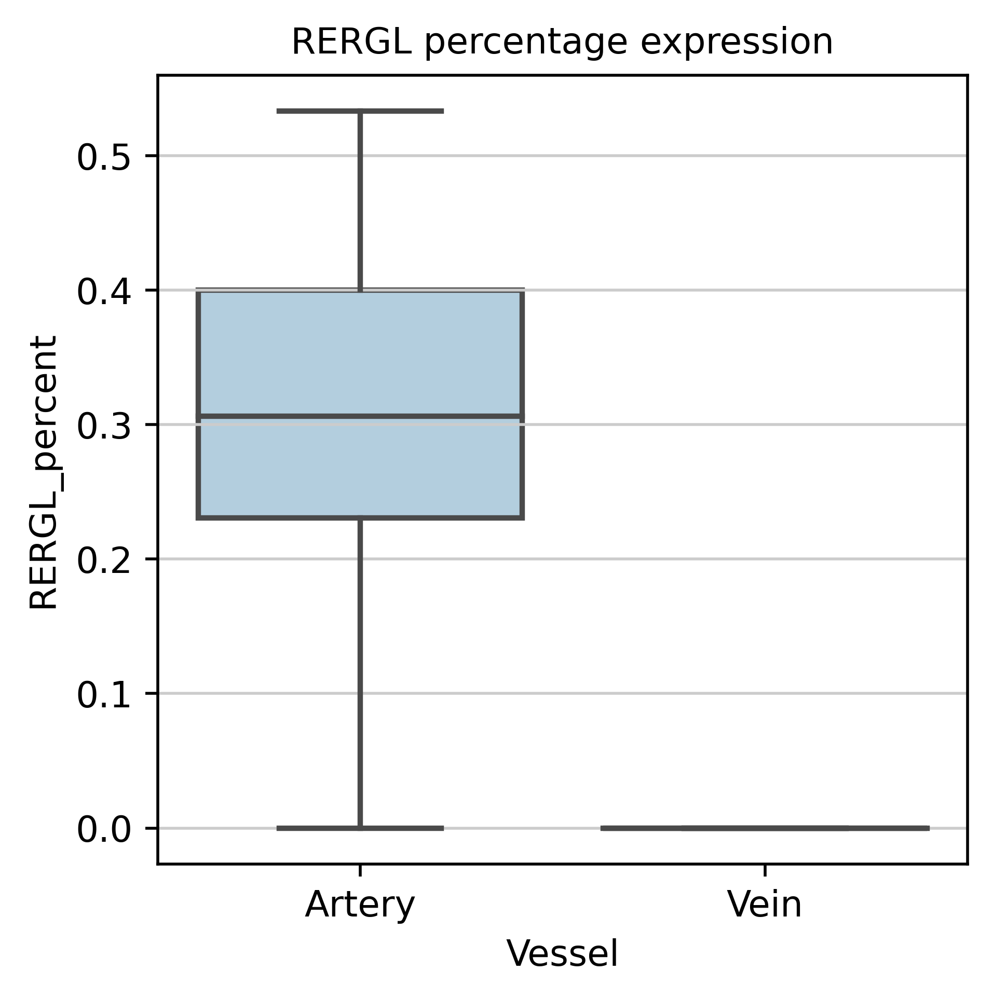

In [65]:
sns.boxplot(data = test, x = "Vessel", y = "RERGL_percent", palette = 'Blues', order = ['Artery','Vein']).set(title='RERGL percentage expression')

[Text(0.5, 1.0, 'RERGL mean expression')]

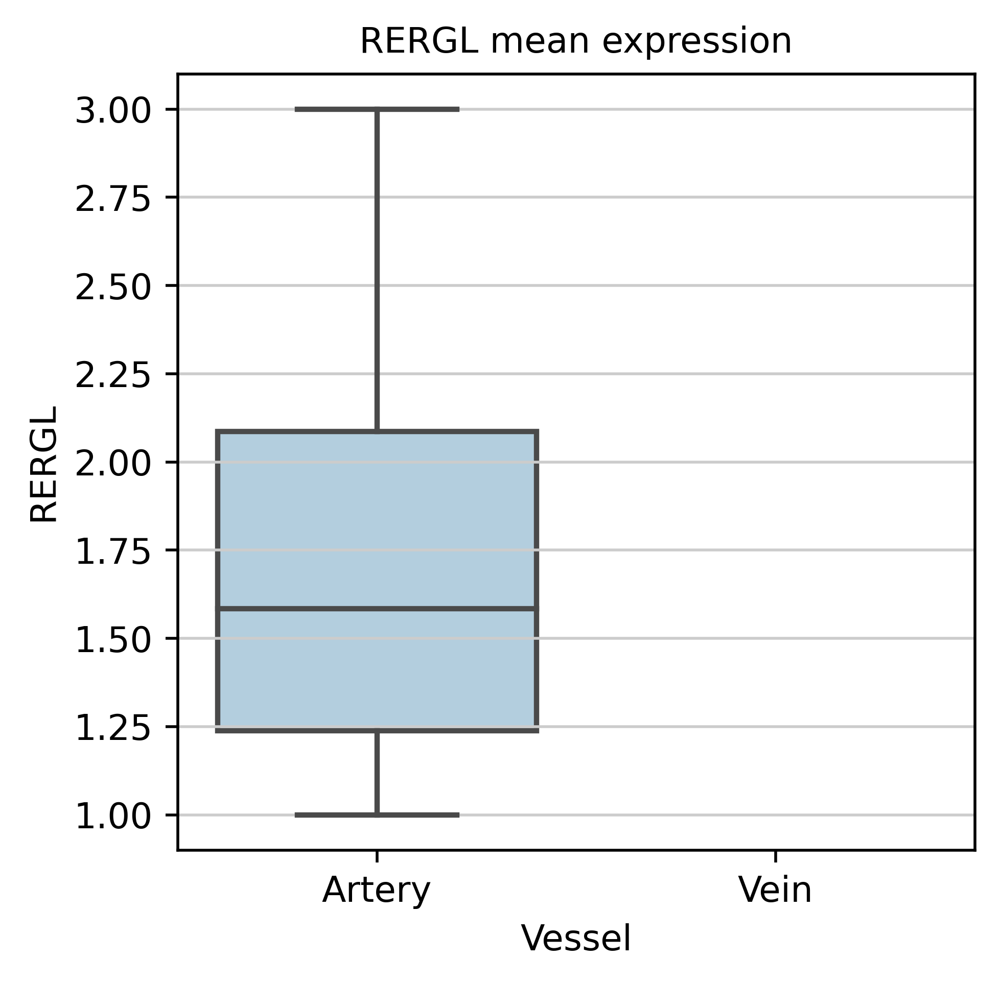

In [66]:
sns.boxplot(data = test, x = "Vessel", y = "RERGL", palette = 'Blues', order = ['Artery','Vein']).set(title='RERGL mean expression')

[Text(0.5, 1.0, 'STEAP4 percentage expression')]

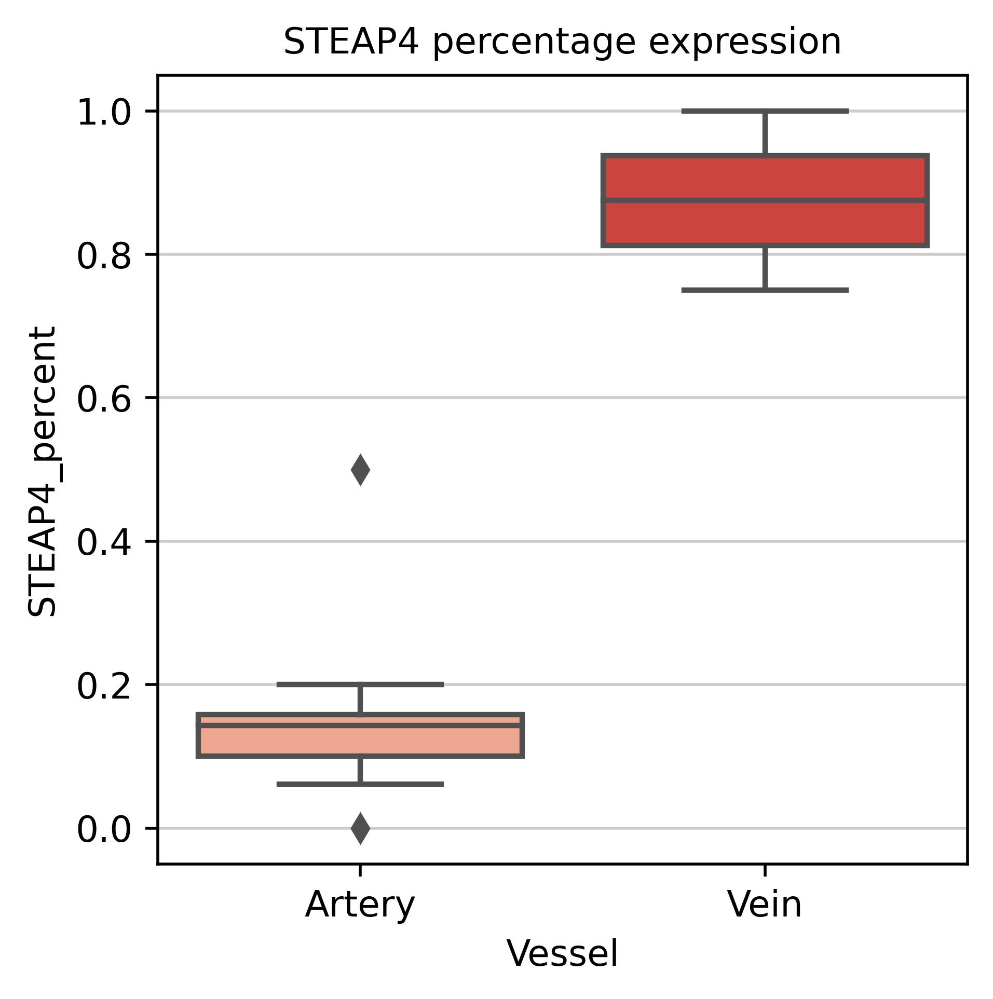

In [67]:
sns.boxplot(data = test, x = "Vessel", y = "STEAP4_percent", palette = 'Reds', order = ['Artery','Vein']).set(title='STEAP4 percentage expression')

[Text(0.5, 1.0, 'STEAP4 mean expression')]

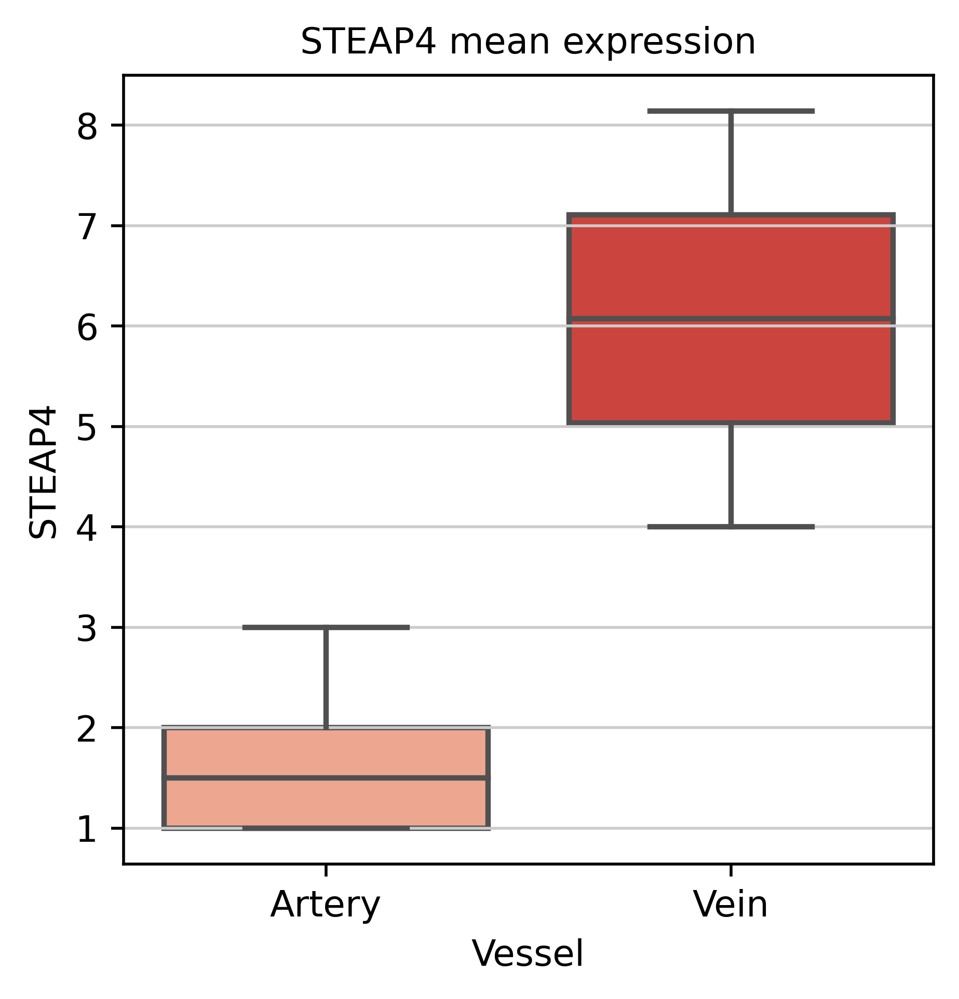

In [68]:
sns.boxplot(data = test, x = "Vessel", y = "STEAP4", palette = 'Reds', order = ['Artery','Vein']).set(title='STEAP4 mean expression')

[Text(0.5, 1.0, 'KCNJ8 percentage expression')]

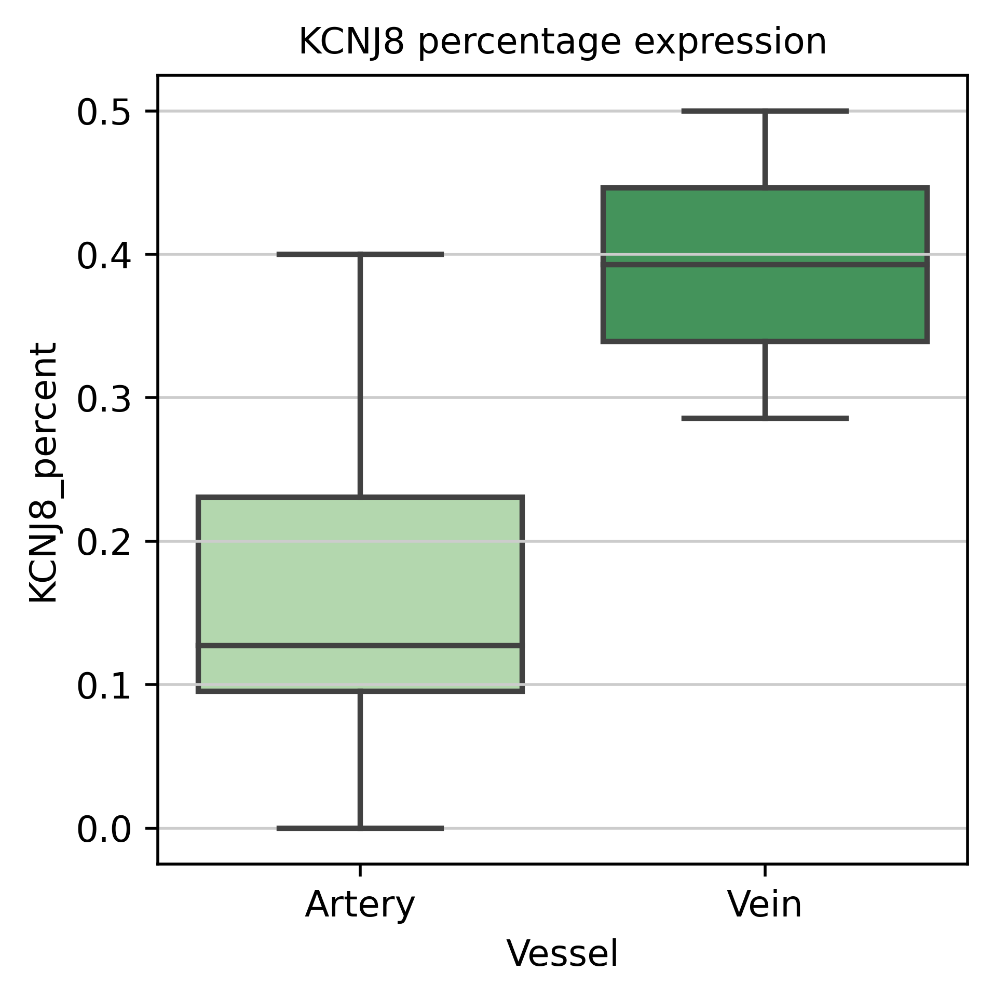

In [72]:
sns.boxplot(data = test, x = "Vessel", y = "KCNJ8_percent", palette = 'Greens', order = ['Artery','Vein']).set(title='KCNJ8 percentage expression')

[Text(0.5, 1.0, 'KCNJ8 mean expression')]

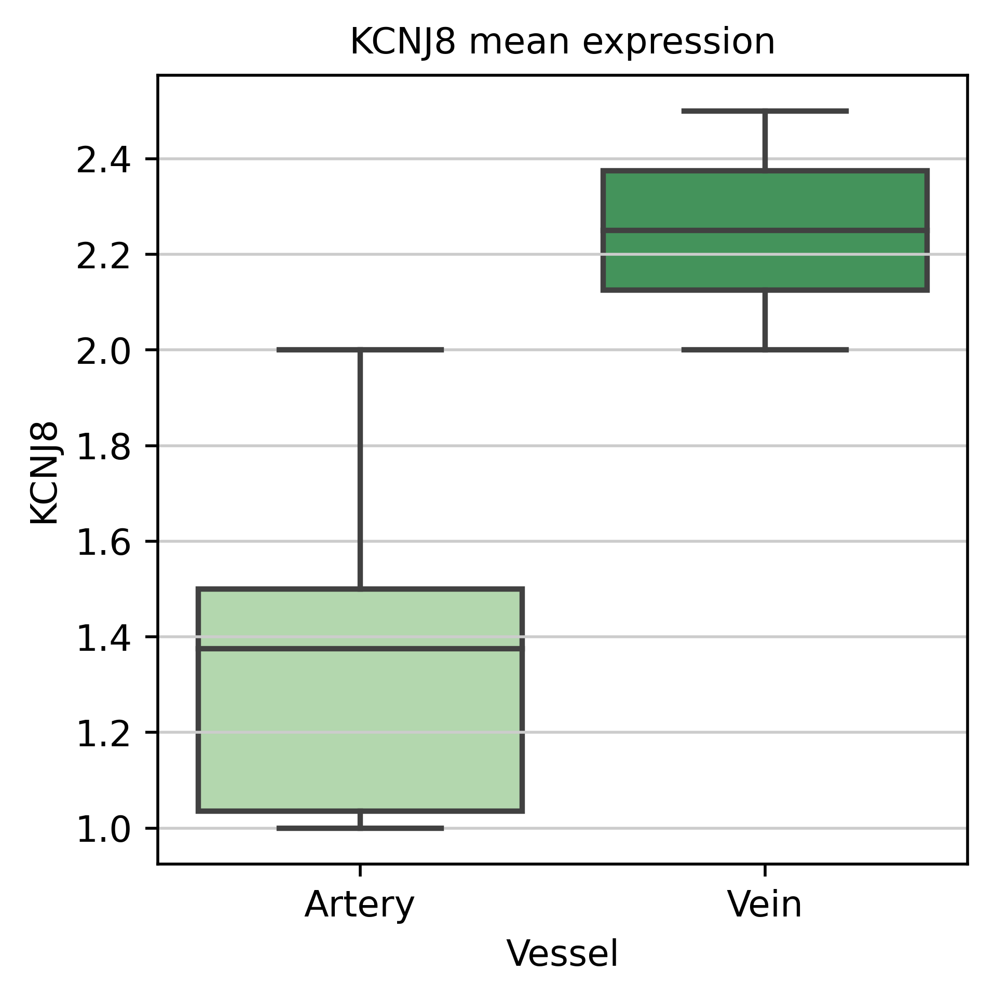

In [71]:
sns.boxplot(data = test, x = "Vessel", y = "KCNJ8", palette = 'Greens', order = ['Artery','Vein']).set(title='KCNJ8 mean expression')

In [69]:
test

,RERGL_percent,STEAP4_percent,FGF7_percent,KCNJ8_percent,AGT_percent,STEAP4_FGF7_percent,STEAP4_KCNJ8_percent,RERGL,STEAP4,FGF7,AGT,KCNJ8,SEMA3G,ACKR1,RGCC,SMOC1,Vessel,ROI
ROI_C2-2_12,0.000000,0.125000,0.000000,0.125000,0.125000,0.000000,0.000000,NaN,1.000000,NaN,2.000000,1.000000,1.000000,NaN,2.500000,NaN,Unclear,C2-2
ROI_C2-2_14,0.272727,0.000000,0.000000,0.181818,0.909091,0.000000,0.000000,1.000000,NaN,NaN,2.700000,1.500000,1.000000,NaN,2.200000,NaN,Artery,C2-2
ROI_C2-2_16,0.000000,0.083333,0.083333,0.000000,0.083333,0.000000,0.000000,NaN,2.000000,1.000000,2.000000,NaN,NaN,NaN,NaN,3.666667,Endocardium,C2-2
ROI_C2-2_19,0.230769,0.153846,0.000000,0.230769,0.615385,0.000000,0.076923,1.666667,3.000000,NaN,1.875000,2.000000,1.166667,NaN,1.000000,NaN,Artery,C2-2
ROI_C2-2_22,0.527273,0.145455,0.027273,0.127273,0.636364,0.009091,0.000000,2.344828,1.500000,1.333333,4.071429,1.142857,1.187500,NaN,1.000000,NaN,Artery,C2-2
ROI_C2-2_23,0.166667,0.500000,0.166667,0.333333,0.666667,0.166667,0.166667,1.000000,3.666667,1.000000,6.500000,2.500000,2.000000,NaN,2.333333,NaN,Capillary,C2-2
ROI_C2-2_24,0.000000,0.142857,0.000000,0.000000,0.285714,0.000000,0.000000,NaN,1.000000,NaN,2.500000,NaN,1.000000,NaN,NaN,NaN,Artery,C2-2
ROI_C2-2_26,0.533333,0.200000,0.133333,0.266667,0.466667,0.000000,0.000000,3.000000,1.000000,1.000000,2.000000,1.500000,2.000000,NaN,NaN,NaN,Artery,C2-2
ROI_C2-2_29,0.263158,0.157895,0.210526,0.105263,0.578947,0.052632,0.000000,1.200000,1.666667,2.000000,2.090909,1.500000,1.000000,NaN,4.375000,1.000000,Artery,C2-2
ROI_C2-2_33,0.166667,0.500000,0.333333,0.333333,0.500000,0.166667,0.166667,1.000000,2.666667,1.000000,3.333333,1.000000,NaN,NaN,2.000000,NaN,Unclear,C2-2
